# Machine Learning Temperature Regression Analysis


In [0]:
from pyspark.sql.functions import col, sqrt, mean, pow

print('done')

done


### Loading in generated forecast and API forecast

In [0]:
df = spark.read.parquet('/mnt/de-upskilling-weather/Gold/temp_forecasts.parquet/').drop('country', 'latitude', 'longitude', 'time_zone')


In [0]:
display(df)

city,timestamp,pred_temp
Amsterdam,2025-01-15T00:00:00Z,7.320826373807395
Amsterdam,2025-01-15T01:00:00Z,7.138660497480638
Amsterdam,2025-01-15T02:00:00Z,7.646156159372504
Amsterdam,2025-01-15T03:00:00Z,8.195483804083072
Amsterdam,2025-01-15T04:00:00Z,8.541381934346758
Amsterdam,2025-01-15T05:00:00Z,8.263821189688965
Amsterdam,2025-01-15T06:00:00Z,8.34799629675778
Amsterdam,2025-01-15T07:00:00Z,8.283761340352157
Amsterdam,2025-01-15T08:00:00Z,8.194914615448972
Amsterdam,2025-01-15T09:00:00Z,8.34470697111005


In [0]:
forecast = spark.read.parquet('/mnt/de-upskilling-weather/Gold/7day_hourly_forecast.parquet/').select('city', col('date').alias('timestamp'), 'temperature_2m')

print('done')

done


In [0]:
display(forecast)

city,timestamp,temperature_2m
New York,2025-01-18T12:00:00Z,0.40700000524520874
New York,2025-01-18T13:00:00Z,2.25249981880188
New York,2025-01-18T14:00:00Z,3.00249981880188
New York,2025-01-18T15:00:00Z,3.6024999618530273
New York,2025-01-18T16:00:00Z,4.652500152587891
New York,2025-01-18T17:00:00Z,4.752500057220459
New York,2025-01-18T18:00:00Z,4.302500247955322
New York,2025-01-18T19:00:00Z,5.752500057220459
New York,2025-01-18T20:00:00Z,5.602499961853027
New York,2025-01-18T21:00:00Z,5.552500247955322


In [0]:
cities_dim = spark.read.parquet('/mnt/de-upskilling-weather/Silver/cities_dim.parquet/')
cities_list = cities_dim.select("city").rdd.flatMap(lambda x: x).collect()
cities_list

['Vienna',
 'Ljubljana',
 'Denver',
 'Paris',
 'Zurich',
 'London',
 'Berlin',
 'Philadelphia',
 'Indianapolis',
 'Nashville',
 'Chicago',
 'New York',
 'Miami',
 'Washington, DC',
 'Oklahoma City',
 'Dallas',
 'Seattle',
 'Los Angeles',
 'Prague',
 'Copenhagen',
 'Amsterdam',
 'Dublin',
 'Antwerp',
 'Munich',
 'Madrid']

In [0]:
# only want to compare ML generated temps to forecasted temps

forecast_comparison = df.join(forecast, on=['city', 'timestamp'], how='inner').where("city == 'Zurich'")
display(forecast_comparison)

city,timestamp,pred_temp,temperature_2m
Zurich,2025-01-16T06:00:00Z,1.3921645524108812,1.599500060081482
Zurich,2025-01-16T07:00:00Z,1.232719164572384,1.3995000123977661
Zurich,2025-01-16T08:00:00Z,1.1730998873477896,1.349500060081482
Zurich,2025-01-16T09:00:00Z,1.9759761252747294,2.1494998931884766
Zurich,2025-01-16T10:00:00Z,2.852172361788897,2.8994998931884766
Zurich,2025-01-16T11:00:00Z,3.6175616064870466,3.549499988555908
Zurich,2025-01-16T12:00:00Z,3.5195799221827637,3.3494999408721924
Zurich,2025-01-16T13:00:00Z,3.8958892138250567,3.799499988555908
Zurich,2025-01-16T14:00:00Z,3.9560133990679023,3.8494999408721924
Zurich,2025-01-16T15:00:00Z,3.7139651056750154,3.6494998931884766


## R^2 and RMSE

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

evaluator_rmse = RegressionEvaluator(labelCol="temperature_2m", predictionCol="pred_temp", metricName="rmse")
evaluator_r2 = RegressionEvaluator(labelCol="temperature_2m", predictionCol="pred_temp", metricName="r2")

for city in cities_list:
    forecast_comparison = df.join(forecast, on=['city', 'timestamp'], how='inner').where(col('city') == city)

    rmse = evaluator_rmse.evaluate(forecast_comparison)
    r2 = evaluator_r2.evaluate(forecast_comparison)

    print(f'City: {city}')
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"R^2 value (R2): {r2}\n")

City: Vienna
Root Mean Squared Error (RMSE): 0.3210948596947536
R^2 value (R2): 0.9636284702996392

City: Ljubljana
Root Mean Squared Error (RMSE): 0.295839508767107
R^2 value (R2): 0.974717511939487

City: Denver
Root Mean Squared Error (RMSE): 0.6698145786041383
R^2 value (R2): 0.9925978194884729

City: Paris
Root Mean Squared Error (RMSE): 0.337041603566822
R^2 value (R2): 0.9674047199191478

City: Zurich
Root Mean Squared Error (RMSE): 0.3146339636322618
R^2 value (R2): 0.9740222050498993

City: London
Root Mean Squared Error (RMSE): 0.129740905058833
R^2 value (R2): 0.9969077869862749

City: Berlin
Root Mean Squared Error (RMSE): 0.20980706619364745
R^2 value (R2): 0.9901196875948796

City: Philadelphia
Root Mean Squared Error (RMSE): 0.7388313254382916
R^2 value (R2): 0.9736801778322819

City: Indianapolis
Root Mean Squared Error (RMSE): 1.1827492645883009
R^2 value (R2): 0.9699809537013728

City: Nashville
Root Mean Squared Error (RMSE): 0.7568536211950907
R^2 value (R2): 0.9849

In [0]:
seven_day_hourly = spark.read.parquet('/mnt/de-upskilling-weather/Gold/7day_hourly_forecast.parquet/').withColumnRenamed('date', 'timestamp')
display(seven_day_hourly)

latitude,longitude,timestamp,timezone,temperature_2m,relative_humidity_2m,precipitation_probability,precipitation,rain,showers,snowfall,snow_depth,weather_code,wind_speed_10m,wind_speed_80m,wind_speed_120m,wind_speed_180m,wind_direction_10m,wind_direction_80m,wind_direction_120m,wind_direction_180m,wind_gusts_10m,dew_point_2m,cloud_cover,shortwave_radiation,pressure_msl,surface_pressure,city,country,time_zone,Time,offset_seconds,Local_Time,UTC_Time
40.724039,-73.994982,2025-01-18T12:00:00Z,America/New_York,0.40700000524520874,82.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,16.65753936767578,37.420955657958984,30.84798812866211,52.915103912353516,186.20335388183594,187.74024963378906,192.38075256347656,193.37445068359375,37.439998626708984,-2.308091163635254,100.0,0.0,1018.0999755859375,1014.5472412109375,New York,United States,-4:00,1737201600,-14400.0,2025-01-18 07:00:00,2025-01-18 12:00:00
40.724039,-73.994982,2025-01-18T13:00:00Z,America/New_York,2.25249981880188,77.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,17.227418899536133,28.112287521362305,30.566587448120117,54.08393478393555,190.8402557373047,189.58287048339844,189.688720703125,191.9082794189453,50.39999771118164,-1.3645704984664917,100.0,13.0,1016.2999877929688,1012.7774047851562,New York,United States,-4:00,1737205200,-14400.0,2025-01-18 08:00:00,2025-01-18 13:00:00
40.724039,-73.994982,2025-01-18T14:00:00Z,America/New_York,3.00249981880188,75.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,17.581125259399414,28.24107551574707,30.69881820678711,54.57770919799805,190.61959838867188,191.02340698242188,191.0408935546875,188.34381103515625,51.119998931884766,-0.997026264667511,100.0,91.0,1015.9000244140625,1012.3883056640625,New York,United States,-4:00,1737208800,-14400.0,2025-01-18 09:00:00,2025-01-18 14:00:00
40.724039,-73.994982,2025-01-18T15:00:00Z,America/New_York,3.6024999618530273,73.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,16.56391143798828,27.419145584106445,29.84469985961914,54.98579788208008,181.24533081054688,183.7639617919922,184.23631286621094,185.63584899902344,48.959999084472656,-0.7872645258903503,100.0,143.0,1014.7999877929688,1011.2996215820312,New York,United States,-4:00,1737212400,-14400.0,2025-01-18 10:00:00,2025-01-18 15:00:00
40.724039,-73.994982,2025-01-18T16:00:00Z,America/New_York,4.652500152587891,71.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,17.727943420410156,29.09103012084961,31.20699119567871,48.733150482177734,192.90740966796875,192.14425659179688,192.23609924316406,184.23631286621094,51.47999954223633,-0.15755900740623474,100.0,223.0,1014.4000244140625,1010.9143676757812,New York,United States,-4:00,1737216000,-14400.0,2025-01-18 11:00:00,2025-01-18 16:00:00
40.724039,-73.994982,2025-01-18T17:00:00Z,America/New_York,4.752500057220459,72.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,15.281989097595215,24.62778663635254,26.65189552307129,36.424102783203125,195.01841735839844,195.2551727294922,195.18588256835938,176.60035705566406,48.959999084472656,0.1315135508775711,100.0,189.0,1012.5999755859375,1009.121826171875,New York,United States,-4:00,1737219600,-14400.0,2025-01-18 12:00:00,2025-01-18 17:00:00
40.724039,-73.994982,2025-01-18T18:00:00Z,America/New_York,4.302500247955322,80.0,5.0,0.0,0.0,0.0,0.0,0.0,3.0,11.609650611877441,20.83339500427246,23.137451171875,40.6337776184082,187.1249237060547,189.9505615234375,190.0606231689453,172.8750762939453,33.119998931884766,1.1560931205749512,100.0,64.0,1011.0,1007.5216064453125,New York,United States,-4:00,1737223200,-14400.0,2025-01-18 13:00:00,2025-01-18 18:00:00
40.724039,-73.994982,2025-01-18T19:00:00Z,America/New_York,5.752500057220459,80.0,45.0,0.0,0.0,0.0,0.0,0.0,3.0,15.496735572814941,25.364036560058594,27.391395568847656,42.93669509887695,182.66294860839844,186.5196990966797,186.9342498779297,176.154052734375,44.279998779296875,2.5693321228027344,100.0,165.0,1009.7999877929688,1006.3438110351562,New York,United States,-4:00,1737226800,-14400.0,2025-01-18 14:00:00,2025-01-18 19:00:00
40.724039,-73.994982,2025-01-18T20:00:00Z,America/New_York,5.602499961853027,88.0,45

In [0]:
hourly_historical = spark.read.parquet('/mnt/de-upskilling-weather/Gold/hourly_historical.parquet/')

In [0]:
from pyspark.sql.functions import col
display(hourly_historical.where((col('city') == 'Amsterdam') & (col('month') == 1)).orderBy('datetime').select('datetime', 'temperature_2m'))

datetime,temperature_2m
2010-01-01 00:00:00,-0.03449999913573265
2010-01-01 01:00:00,-0.03449999913573265
2010-01-01 02:00:00,-0.18450000882148743
2010-01-01 03:00:00,-0.2345000058412552
2010-01-01 04:00:00,-0.28450000286102295
2010-01-01 05:00:00,-0.534500002861023
2010-01-01 06:00:00,-0.734499990940094
2010-01-01 07:00:00,-0.8845000267028809
2010-01-01 08:00:00,-1.2344999313354492
2010-01-01 09:00:00,-1.0844999551773071


In [0]:
citydf = df.join(seven_day_hourly.select('timestamp', 'city', 'temperature_2m', 'shortwave_radiation', 'pressure_msl', 'surface_pressure', 'relative_humidity_2m', 
'dew_point_2m', 'cloud_cover'), on=['city', 'timestamp'], how='inner').where(col('city') == 'Copenhagen').drop('city')
citydf.display()

timestamp,pred_temp,temperature_2m,shortwave_radiation,pressure_msl,surface_pressure,relative_humidity_2m,dew_point_2m,cloud_cover
2025-01-18T12:00:00Z,7.114109029769856,5.61299991607666,48.0,1031.5999755859375,1030.336669921875,87.0,3.6190385818481445,100.0
2025-01-18T13:00:00Z,7.0858087352517565,5.61299991607666,38.0,1031.300048828125,1030.037109375,87.0,3.6190385818481445,100.0
2025-01-18T14:00:00Z,6.988687688863559,5.563000202178955,26.0,1030.9000244140625,1029.63720703125,86.0,3.4058115482330322,100.0
2025-01-18T15:00:00Z,6.901857067614603,5.4629998207092285,12.0,1030.800048828125,1029.537109375,86.0,3.3075380325317383,100.0
2025-01-18T16:00:00Z,6.266797086803307,5.313000202178955,0.0,1030.699951171875,1029.4364013671875,87.0,3.32382869720459,100.0
2025-01-18T17:00:00Z,6.266797086803307,5.013000011444092,0.0,1030.4000244140625,1029.13525390625,89.0,3.3503026962280273,100.0
2025-01-18T18:00:00Z,6.270112490698306,4.663000106811523,0.0,1029.800048828125,1028.5347900390625,91.0,3.3194491863250732,100.0
2025-01-18T19:00:00Z,6.324497717995803,4.413000106811523,0.0,1029.4000244140625,1028.1339111328125,92.0,3.226789712905884,100.0
2025-01-18T20:00:00Z,6.344892523732473,4.11299991607666,0.0,1029.300048828125,1028.0328369140625,93.0,3.082444190979004,100.0
2025-01-18T21:00:00Z,6.353421746635364,3.9630000591278076,0.0,1029.0999755859375,1027.832275390625,93.0,2.933692455291748,100.0


/databricks/spark/python/pyspark/pandas/plot/matplotlib.py:858: FutureWarning: Argument `sort_columns` will be removed in 4.0.0.
  warnings.warn(


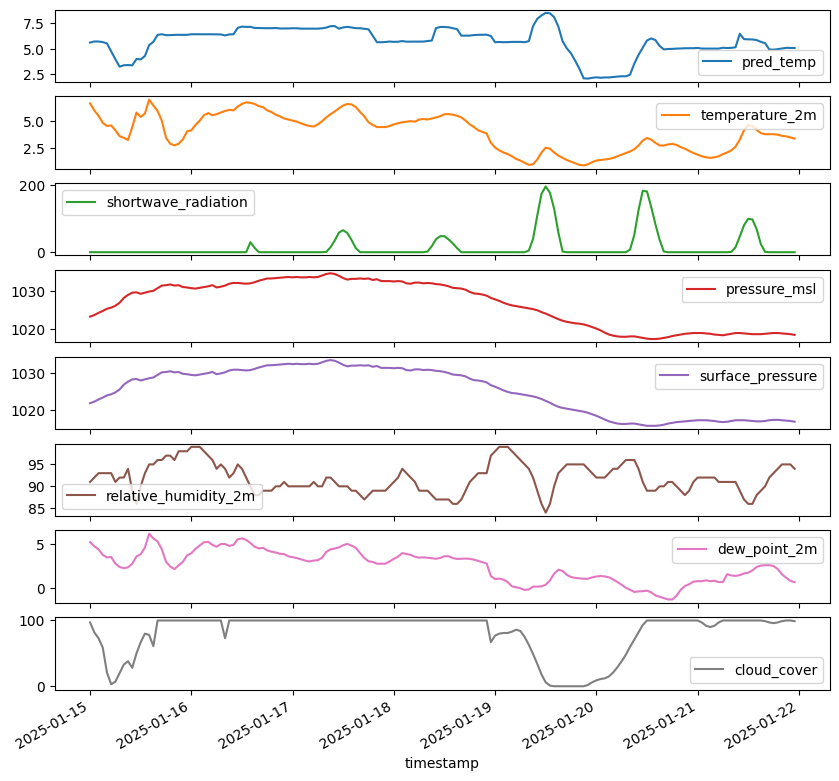

In [0]:
import pyspark.pandas as ps
import matplotlib.pyplot as plt

# Set the plotting backend to matplotlib
ps.options.plotting.backend = "matplotlib"

results_pandas = citydf.pandas_api()
results_pandas.plot(x='timestamp', kind='line', subplots=True, figsize=(10, 10))
plt.show()